In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

/home/palak/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
!mkdir data



In [4]:
!pip install tqdm
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)


  Using cached tqdm-4.19.7-py2.py3-none-any.whl


SVHN Training Set: 182MB [01:13, 2.46MB/s]                           
SVHN Testing Set: 64.3MB [00:23, 2.76MB/s]                            


In [5]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y


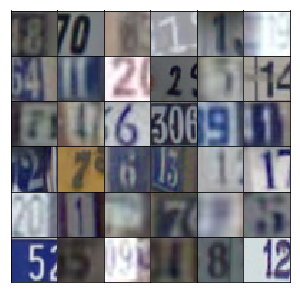

In [8]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

In [9]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

In [10]:
def conv_transpose_layer(prev_layer, filter, kernel_size, strides, is_training, alpha):
    x = tf.layers.conv2d_transpose(prev_layer, filter, kernel_size, strides, 'same')
    x = tf.layers.batch_normalization(x, training=is_training)
    x = tf.maximum(x, alpha*x)
    return x

def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(x1, alpha*x1)
        # 4x4x512 now

        x2 = conv_transpose_layer(x1, 256, 5, 2, training, alpha)
        # 8x8x256 now
        
        x3 = conv_transpose_layer(x2, 128, 5, 2, training, alpha)
        # 16x16x128 now
               
        # Output layer, 32x32x3
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, 2, 'same')
        # 32x32x3 now

        out = tf.tanh(logits)
        
        return out

In [11]:
def conv_layer(prev_layer, filters, is_training, alpha, batch_norm=True):
    conv_layer = tf.layers.conv2d(prev_layer, filters, 5, 2, 'same', use_bias=False, activation=None)
    if batch_norm:
        conv_layer = tf.layers.batch_normalization(conv_layer, training=is_training)
    conv_layer = tf.maximum(conv_layer, alpha*conv_layer)
    return conv_layer

def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = conv_layer(x, 64, True, alpha, False)
        # 16x16x64

        x2 = conv_layer(x1, 128, True, alpha, True)
        # 8x8x128

        x3 = conv_layer(x2, 256, True, alpha, True)
        # 4x4x256

        flat = tf.reshape(x3, (-1, 4*4*256))

        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

In [12]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

In [13]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

In [14]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=0.2)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)


In [15]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

In [16]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples


In [17]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 25
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25... Discriminator Loss: 1.1118... Generator Loss: 0.8196
Epoch 1/25... Discriminator Loss: 0.5551... Generator Loss: 1.4804
Epoch 1/25... Discriminator Loss: 0.1406... Generator Loss: 3.0018
Epoch 1/25... Discriminator Loss: 0.1414... Generator Loss: 2.7761
Epoch 1/25... Discriminator Loss: 0.2049... Generator Loss: 2.5422
Epoch 1/25... Discriminator Loss: 0.1009... Generator Loss: 3.4366
Epoch 1/25... Discriminator Loss: 0.1474... Generator Loss: 2.7539
Epoch 1/25... Discriminator Loss: 0.1870... Generator Loss: 2.6260
Epoch 1/25... Discriminator Loss: 0.1520... Generator Loss: 2.8918
Epoch 1/25... Discriminator Loss: 0.1688... Generator Loss: 2.8974


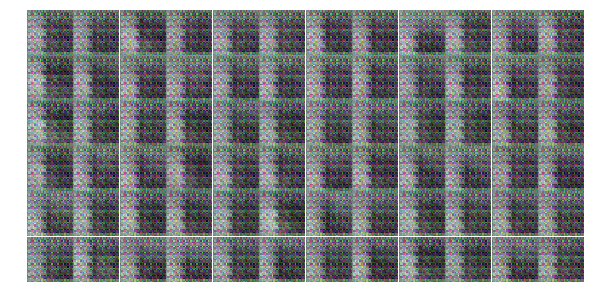

Epoch 1/25... Discriminator Loss: 0.4315... Generator Loss: 1.9284
Epoch 1/25... Discriminator Loss: 0.8627... Generator Loss: 0.8801
Epoch 1/25... Discriminator Loss: 0.6945... Generator Loss: 2.0816
Epoch 1/25... Discriminator Loss: 0.4210... Generator Loss: 1.6621
Epoch 1/25... Discriminator Loss: 0.6016... Generator Loss: 1.5699
Epoch 1/25... Discriminator Loss: 0.5206... Generator Loss: 2.2628
Epoch 1/25... Discriminator Loss: 0.4132... Generator Loss: 1.8472
Epoch 1/25... Discriminator Loss: 0.4713... Generator Loss: 1.6610
Epoch 1/25... Discriminator Loss: 0.6882... Generator Loss: 1.7508
Epoch 1/25... Discriminator Loss: 0.4082... Generator Loss: 2.2737


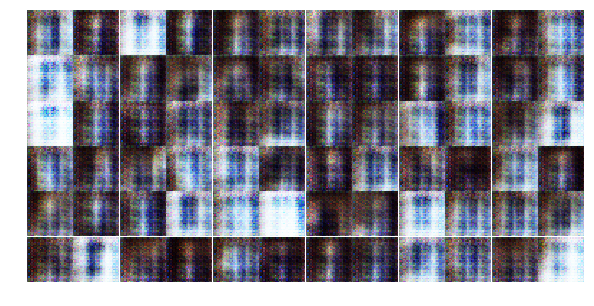

Epoch 1/25... Discriminator Loss: 0.5967... Generator Loss: 1.9766
Epoch 1/25... Discriminator Loss: 0.6740... Generator Loss: 1.9245
Epoch 1/25... Discriminator Loss: 0.5307... Generator Loss: 2.0141
Epoch 1/25... Discriminator Loss: 0.5852... Generator Loss: 1.3538
Epoch 1/25... Discriminator Loss: 0.5446... Generator Loss: 3.3761
Epoch 1/25... Discriminator Loss: 0.6770... Generator Loss: 1.1058
Epoch 1/25... Discriminator Loss: 0.2523... Generator Loss: 2.1484
Epoch 1/25... Discriminator Loss: 0.5326... Generator Loss: 2.1989
Epoch 1/25... Discriminator Loss: 1.7100... Generator Loss: 5.0510
Epoch 1/25... Discriminator Loss: 0.9229... Generator Loss: 2.9546


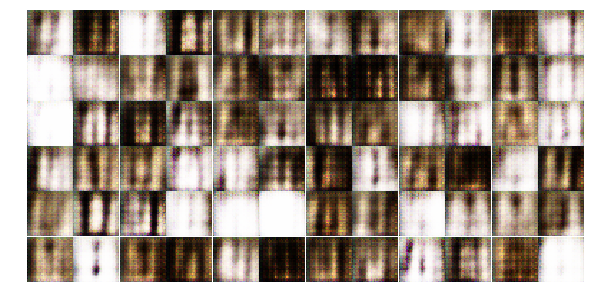

Epoch 1/25... Discriminator Loss: 1.4855... Generator Loss: 0.6097
Epoch 1/25... Discriminator Loss: 0.5389... Generator Loss: 1.6239
Epoch 1/25... Discriminator Loss: 1.1898... Generator Loss: 0.6229
Epoch 1/25... Discriminator Loss: 0.5414... Generator Loss: 2.7701
Epoch 1/25... Discriminator Loss: 0.5087... Generator Loss: 2.0601
Epoch 1/25... Discriminator Loss: 1.0043... Generator Loss: 1.1369
Epoch 1/25... Discriminator Loss: 0.8768... Generator Loss: 1.0689
Epoch 1/25... Discriminator Loss: 0.3492... Generator Loss: 2.3376
Epoch 1/25... Discriminator Loss: 1.1320... Generator Loss: 1.1620
Epoch 1/25... Discriminator Loss: 1.0720... Generator Loss: 1.2146


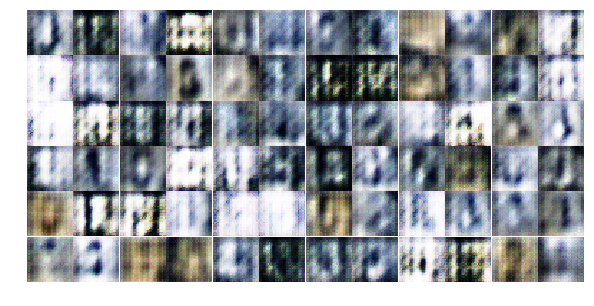

Epoch 1/25... Discriminator Loss: 0.7411... Generator Loss: 1.1922
Epoch 1/25... Discriminator Loss: 0.6518... Generator Loss: 1.4410
Epoch 1/25... Discriminator Loss: 0.9139... Generator Loss: 2.0575
Epoch 1/25... Discriminator Loss: 1.1688... Generator Loss: 0.6900
Epoch 1/25... Discriminator Loss: 0.6270... Generator Loss: 1.1853
Epoch 1/25... Discriminator Loss: 0.7962... Generator Loss: 0.9308
Epoch 1/25... Discriminator Loss: 0.9055... Generator Loss: 0.7913
Epoch 1/25... Discriminator Loss: 0.8425... Generator Loss: 1.2255
Epoch 1/25... Discriminator Loss: 1.0309... Generator Loss: 0.6958
Epoch 1/25... Discriminator Loss: 0.7342... Generator Loss: 1.3546


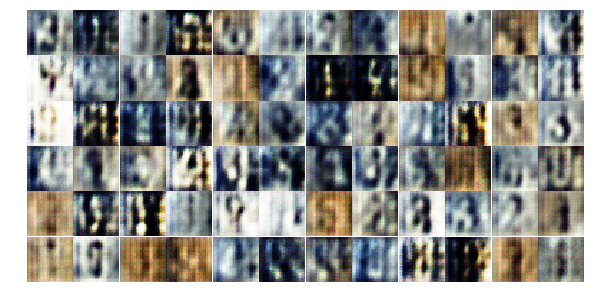

Epoch 1/25... Discriminator Loss: 0.7690... Generator Loss: 1.0191
Epoch 1/25... Discriminator Loss: 1.2962... Generator Loss: 0.5181
Epoch 1/25... Discriminator Loss: 0.6673... Generator Loss: 1.3661
Epoch 1/25... Discriminator Loss: 0.6131... Generator Loss: 1.3746
Epoch 1/25... Discriminator Loss: 0.6164... Generator Loss: 1.9268
Epoch 1/25... Discriminator Loss: 0.4719... Generator Loss: 1.4066
Epoch 1/25... Discriminator Loss: 0.8452... Generator Loss: 1.3563
Epoch 2/25... Discriminator Loss: 0.6203... Generator Loss: 1.7899
Epoch 2/25... Discriminator Loss: 0.5651... Generator Loss: 1.3920
Epoch 2/25... Discriminator Loss: 1.2579... Generator Loss: 0.5332


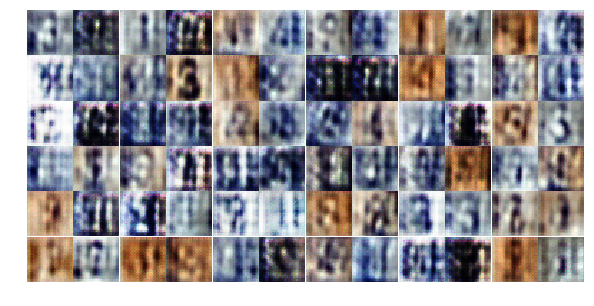

Epoch 2/25... Discriminator Loss: 0.8323... Generator Loss: 1.3932
Epoch 2/25... Discriminator Loss: 0.9110... Generator Loss: 1.4170
Epoch 2/25... Discriminator Loss: 1.0644... Generator Loss: 0.9150
Epoch 2/25... Discriminator Loss: 0.8197... Generator Loss: 1.1912
Epoch 2/25... Discriminator Loss: 0.6602... Generator Loss: 1.1459
Epoch 2/25... Discriminator Loss: 0.8661... Generator Loss: 2.8722
Epoch 2/25... Discriminator Loss: 0.6556... Generator Loss: 1.2959
Epoch 2/25... Discriminator Loss: 1.4386... Generator Loss: 0.4500
Epoch 2/25... Discriminator Loss: 1.4449... Generator Loss: 0.3709
Epoch 2/25... Discriminator Loss: 0.9605... Generator Loss: 0.8822


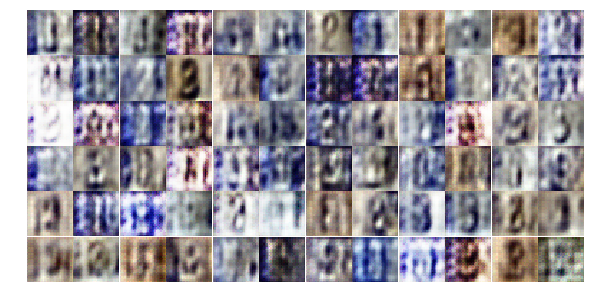

Epoch 2/25... Discriminator Loss: 0.8973... Generator Loss: 1.1964
Epoch 2/25... Discriminator Loss: 1.1170... Generator Loss: 2.2250
Epoch 2/25... Discriminator Loss: 1.0143... Generator Loss: 0.9215
Epoch 2/25... Discriminator Loss: 0.9841... Generator Loss: 1.3247
Epoch 2/25... Discriminator Loss: 1.2148... Generator Loss: 0.7984
Epoch 2/25... Discriminator Loss: 1.5771... Generator Loss: 0.6387
Epoch 2/25... Discriminator Loss: 1.0226... Generator Loss: 0.9231
Epoch 2/25... Discriminator Loss: 1.4909... Generator Loss: 0.4193
Epoch 2/25... Discriminator Loss: 0.7517... Generator Loss: 1.2253
Epoch 2/25... Discriminator Loss: 1.5711... Generator Loss: 0.3417


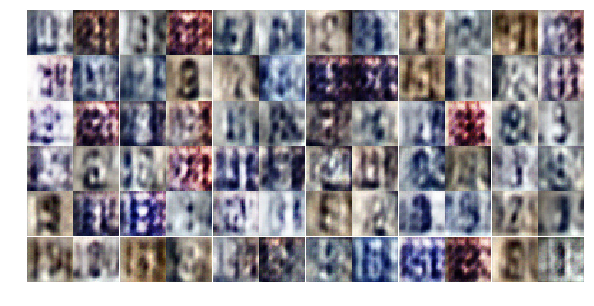

Epoch 2/25... Discriminator Loss: 1.2105... Generator Loss: 0.6473
Epoch 2/25... Discriminator Loss: 0.9738... Generator Loss: 1.0219
Epoch 2/25... Discriminator Loss: 0.5782... Generator Loss: 1.3295
Epoch 2/25... Discriminator Loss: 0.4683... Generator Loss: 2.3116
Epoch 2/25... Discriminator Loss: 0.8711... Generator Loss: 1.5666
Epoch 2/25... Discriminator Loss: 0.8327... Generator Loss: 0.8490
Epoch 2/25... Discriminator Loss: 1.7206... Generator Loss: 0.2925
Epoch 2/25... Discriminator Loss: 1.2831... Generator Loss: 0.5096
Epoch 2/25... Discriminator Loss: 0.9973... Generator Loss: 0.8046
Epoch 2/25... Discriminator Loss: 1.1569... Generator Loss: 0.7144


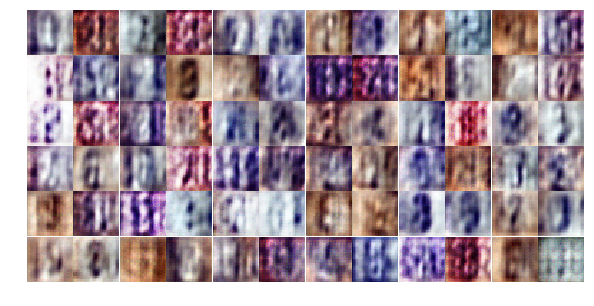

Epoch 2/25... Discriminator Loss: 0.9546... Generator Loss: 1.1228
Epoch 2/25... Discriminator Loss: 1.4218... Generator Loss: 0.4486
Epoch 2/25... Discriminator Loss: 1.5121... Generator Loss: 0.6036
Epoch 2/25... Discriminator Loss: 1.2552... Generator Loss: 0.6507
Epoch 2/25... Discriminator Loss: 1.0692... Generator Loss: 1.0926
Epoch 2/25... Discriminator Loss: 1.4941... Generator Loss: 0.8233
Epoch 2/25... Discriminator Loss: 1.4243... Generator Loss: 0.6251
Epoch 2/25... Discriminator Loss: 0.7751... Generator Loss: 1.7462
Epoch 2/25... Discriminator Loss: 1.2595... Generator Loss: 0.6550
Epoch 2/25... Discriminator Loss: 1.6141... Generator Loss: 0.3318


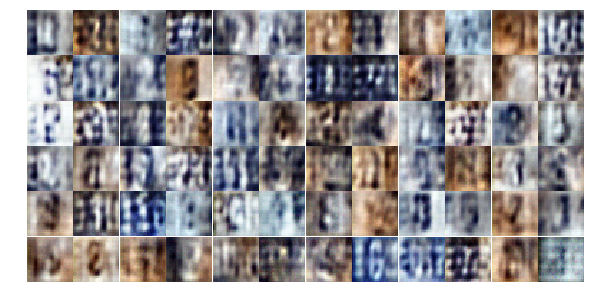

Epoch 2/25... Discriminator Loss: 0.6208... Generator Loss: 2.3430
Epoch 2/25... Discriminator Loss: 1.2735... Generator Loss: 0.9884
Epoch 2/25... Discriminator Loss: 1.1006... Generator Loss: 1.1806
Epoch 2/25... Discriminator Loss: 1.3290... Generator Loss: 0.9055
Epoch 2/25... Discriminator Loss: 1.1517... Generator Loss: 0.7421
Epoch 2/25... Discriminator Loss: 1.5894... Generator Loss: 0.4131
Epoch 2/25... Discriminator Loss: 1.0476... Generator Loss: 1.2650
Epoch 2/25... Discriminator Loss: 1.0947... Generator Loss: 0.9488
Epoch 2/25... Discriminator Loss: 0.9240... Generator Loss: 1.3177
Epoch 2/25... Discriminator Loss: 0.7611... Generator Loss: 2.1993


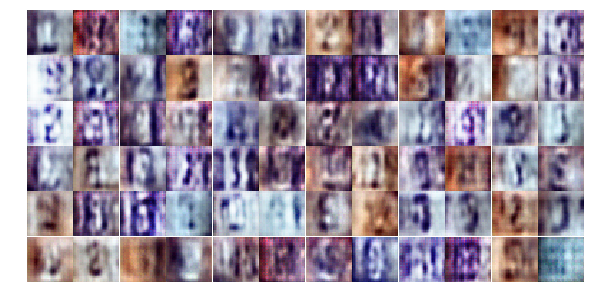

Epoch 2/25... Discriminator Loss: 0.9599... Generator Loss: 0.8808
Epoch 2/25... Discriminator Loss: 0.9334... Generator Loss: 1.1192
Epoch 2/25... Discriminator Loss: 1.3904... Generator Loss: 0.4377
Epoch 2/25... Discriminator Loss: 1.1747... Generator Loss: 0.8269
Epoch 3/25... Discriminator Loss: 0.9671... Generator Loss: 1.5910
Epoch 3/25... Discriminator Loss: 1.0783... Generator Loss: 0.9686
Epoch 3/25... Discriminator Loss: 1.0683... Generator Loss: 0.9158
Epoch 3/25... Discriminator Loss: 0.7319... Generator Loss: 1.2922
Epoch 3/25... Discriminator Loss: 1.1047... Generator Loss: 0.7185
Epoch 3/25... Discriminator Loss: 0.9355... Generator Loss: 1.6878


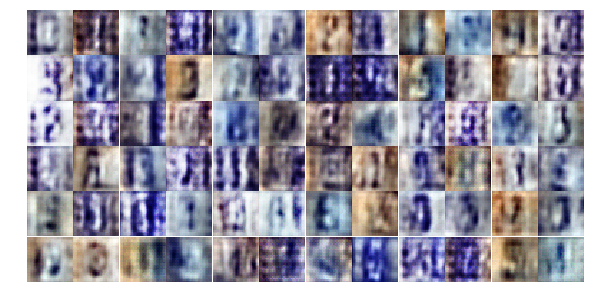

Epoch 3/25... Discriminator Loss: 0.8487... Generator Loss: 1.6967
Epoch 3/25... Discriminator Loss: 1.0625... Generator Loss: 0.7355
Epoch 3/25... Discriminator Loss: 0.9711... Generator Loss: 1.1222
Epoch 3/25... Discriminator Loss: 1.0696... Generator Loss: 0.8221
Epoch 3/25... Discriminator Loss: 1.0359... Generator Loss: 0.9152
Epoch 3/25... Discriminator Loss: 0.7954... Generator Loss: 1.0985
Epoch 3/25... Discriminator Loss: 1.2795... Generator Loss: 0.6044
Epoch 3/25... Discriminator Loss: 0.6379... Generator Loss: 1.6225
Epoch 3/25... Discriminator Loss: 1.2468... Generator Loss: 0.7337
Epoch 3/25... Discriminator Loss: 0.9373... Generator Loss: 0.9402


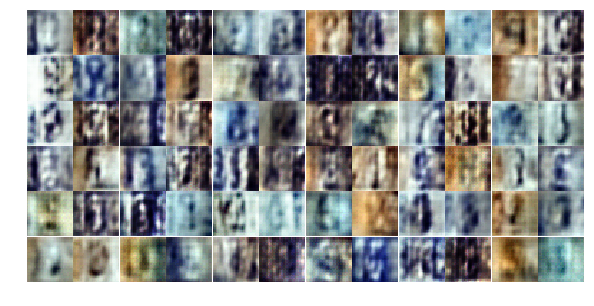

Epoch 3/25... Discriminator Loss: 0.9478... Generator Loss: 0.9645
Epoch 3/25... Discriminator Loss: 0.5044... Generator Loss: 1.4448
Epoch 3/25... Discriminator Loss: 0.7721... Generator Loss: 1.4176
Epoch 3/25... Discriminator Loss: 0.7389... Generator Loss: 1.5197
Epoch 3/25... Discriminator Loss: 0.7875... Generator Loss: 1.4236
Epoch 3/25... Discriminator Loss: 0.9334... Generator Loss: 1.2200
Epoch 3/25... Discriminator Loss: 1.2349... Generator Loss: 0.5451
Epoch 3/25... Discriminator Loss: 0.9011... Generator Loss: 1.7386
Epoch 3/25... Discriminator Loss: 0.4492... Generator Loss: 1.9014
Epoch 3/25... Discriminator Loss: 1.0137... Generator Loss: 0.8518


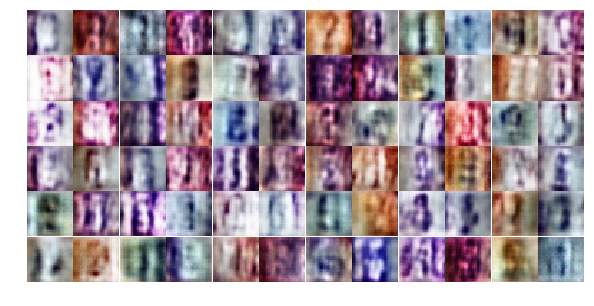

Epoch 3/25... Discriminator Loss: 0.9452... Generator Loss: 0.8770
Epoch 3/25... Discriminator Loss: 0.8911... Generator Loss: 1.6224
Epoch 3/25... Discriminator Loss: 0.6101... Generator Loss: 1.7037
Epoch 3/25... Discriminator Loss: 1.4140... Generator Loss: 0.4099
Epoch 3/25... Discriminator Loss: 0.7521... Generator Loss: 1.2401
Epoch 3/25... Discriminator Loss: 0.7401... Generator Loss: 1.2405
Epoch 3/25... Discriminator Loss: 0.3465... Generator Loss: 2.0001
Epoch 3/25... Discriminator Loss: 0.8753... Generator Loss: 1.4977
Epoch 3/25... Discriminator Loss: 0.4459... Generator Loss: 2.7324
Epoch 3/25... Discriminator Loss: 0.9465... Generator Loss: 1.9163


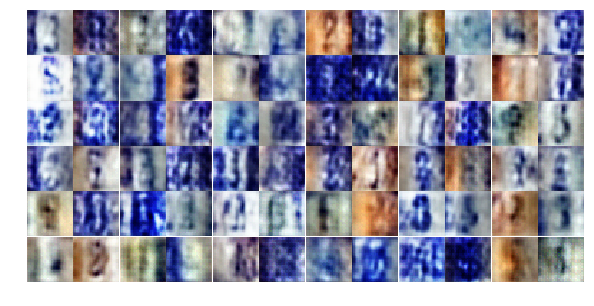

Epoch 3/25... Discriminator Loss: 1.0562... Generator Loss: 2.0511
Epoch 3/25... Discriminator Loss: 0.8023... Generator Loss: 2.1486
Epoch 3/25... Discriminator Loss: 0.8921... Generator Loss: 0.9104
Epoch 3/25... Discriminator Loss: 0.9095... Generator Loss: 0.9959
Epoch 3/25... Discriminator Loss: 0.9167... Generator Loss: 0.7161
Epoch 3/25... Discriminator Loss: 0.9156... Generator Loss: 2.3293
Epoch 3/25... Discriminator Loss: 0.4834... Generator Loss: 1.9608
Epoch 3/25... Discriminator Loss: 0.5843... Generator Loss: 1.3577
Epoch 3/25... Discriminator Loss: 0.5824... Generator Loss: 3.1134
Epoch 3/25... Discriminator Loss: 0.6718... Generator Loss: 1.1308


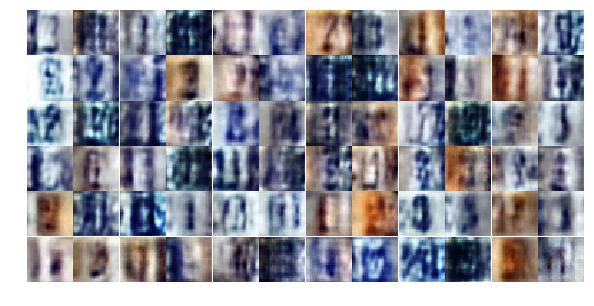

Epoch 3/25... Discriminator Loss: 0.8152... Generator Loss: 1.3634
Epoch 3/25... Discriminator Loss: 0.9582... Generator Loss: 0.7000
Epoch 3/25... Discriminator Loss: 0.7815... Generator Loss: 1.0460
Epoch 3/25... Discriminator Loss: 0.3898... Generator Loss: 2.0844
Epoch 3/25... Discriminator Loss: 0.3972... Generator Loss: 1.6518
Epoch 3/25... Discriminator Loss: 0.4021... Generator Loss: 2.1093
Epoch 3/25... Discriminator Loss: 0.9963... Generator Loss: 2.3582
Epoch 3/25... Discriminator Loss: 0.7429... Generator Loss: 1.4918
Epoch 3/25... Discriminator Loss: 0.5765... Generator Loss: 2.1744
Epoch 3/25... Discriminator Loss: 0.4430... Generator Loss: 1.9533


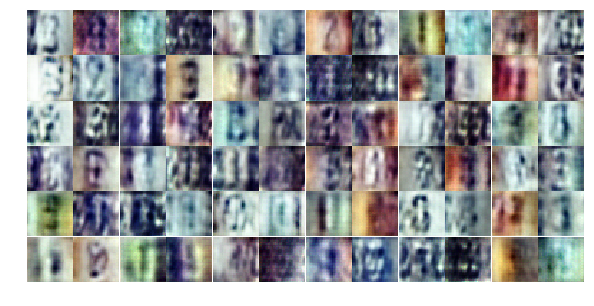

Epoch 3/25... Discriminator Loss: 0.9422... Generator Loss: 0.8568
Epoch 4/25... Discriminator Loss: 0.7442... Generator Loss: 1.0523
Epoch 4/25... Discriminator Loss: 0.7444... Generator Loss: 1.8015
Epoch 4/25... Discriminator Loss: 1.0639... Generator Loss: 0.6049
Epoch 4/25... Discriminator Loss: 0.4093... Generator Loss: 2.3581
Epoch 4/25... Discriminator Loss: 0.9615... Generator Loss: 0.6890
Epoch 4/25... Discriminator Loss: 0.5509... Generator Loss: 1.6293
Epoch 4/25... Discriminator Loss: 0.5168... Generator Loss: 1.7010
Epoch 4/25... Discriminator Loss: 0.9766... Generator Loss: 3.1739
Epoch 4/25... Discriminator Loss: 0.2872... Generator Loss: 2.3102


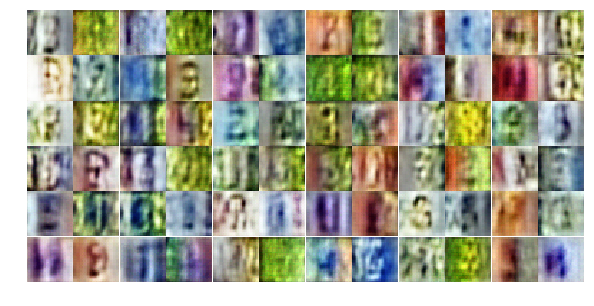

Epoch 4/25... Discriminator Loss: 0.9711... Generator Loss: 0.8470
Epoch 4/25... Discriminator Loss: 1.5381... Generator Loss: 0.3155
Epoch 4/25... Discriminator Loss: 1.2922... Generator Loss: 0.6607
Epoch 4/25... Discriminator Loss: 0.9235... Generator Loss: 0.7705
Epoch 4/25... Discriminator Loss: 1.0380... Generator Loss: 1.3592
Epoch 4/25... Discriminator Loss: 1.3612... Generator Loss: 2.1919
Epoch 4/25... Discriminator Loss: 0.5853... Generator Loss: 1.3180
Epoch 4/25... Discriminator Loss: 0.7082... Generator Loss: 1.1337
Epoch 4/25... Discriminator Loss: 0.6515... Generator Loss: 1.8220
Epoch 4/25... Discriminator Loss: 0.6451... Generator Loss: 2.2869


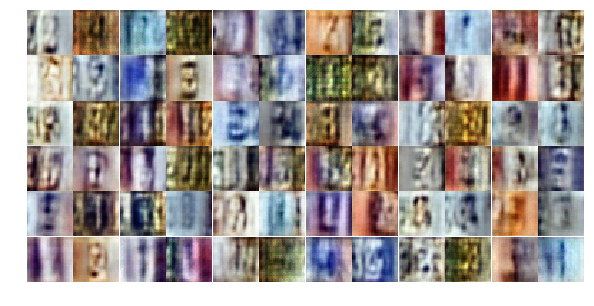

Epoch 4/25... Discriminator Loss: 0.7264... Generator Loss: 1.3203
Epoch 4/25... Discriminator Loss: 0.4677... Generator Loss: 1.9042
Epoch 4/25... Discriminator Loss: 0.9939... Generator Loss: 0.6084
Epoch 4/25... Discriminator Loss: 0.6156... Generator Loss: 1.1453
Epoch 4/25... Discriminator Loss: 0.4998... Generator Loss: 1.4430
Epoch 4/25... Discriminator Loss: 0.7253... Generator Loss: 2.2937
Epoch 4/25... Discriminator Loss: 1.2907... Generator Loss: 0.4491
Epoch 4/25... Discriminator Loss: 0.8477... Generator Loss: 2.3744
Epoch 4/25... Discriminator Loss: 0.3756... Generator Loss: 2.1646
Epoch 4/25... Discriminator Loss: 0.6453... Generator Loss: 1.0383


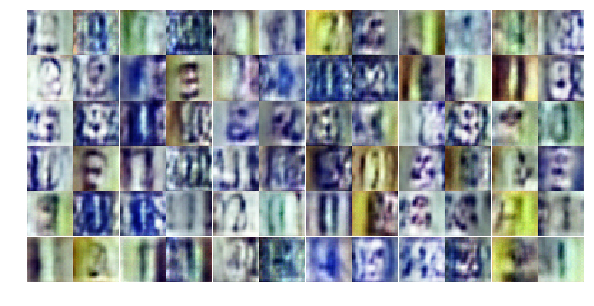

Epoch 4/25... Discriminator Loss: 0.5416... Generator Loss: 1.5822
Epoch 4/25... Discriminator Loss: 0.6251... Generator Loss: 1.1736
Epoch 4/25... Discriminator Loss: 0.4624... Generator Loss: 1.5867
Epoch 4/25... Discriminator Loss: 0.7215... Generator Loss: 1.8715
Epoch 4/25... Discriminator Loss: 0.4943... Generator Loss: 1.9254
Epoch 4/25... Discriminator Loss: 0.6482... Generator Loss: 1.4509
Epoch 4/25... Discriminator Loss: 0.6696... Generator Loss: 1.3465
Epoch 4/25... Discriminator Loss: 0.5487... Generator Loss: 1.8994
Epoch 4/25... Discriminator Loss: 0.7083... Generator Loss: 1.0056
Epoch 4/25... Discriminator Loss: 1.2303... Generator Loss: 0.5046


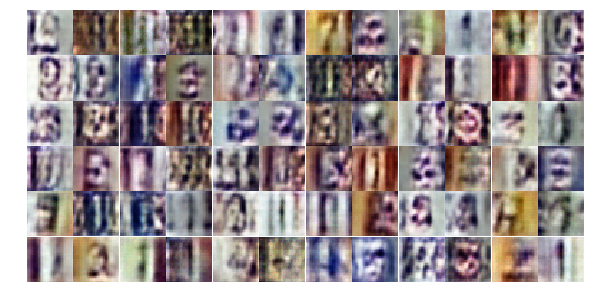

Epoch 4/25... Discriminator Loss: 0.5592... Generator Loss: 1.3806
Epoch 4/25... Discriminator Loss: 0.5980... Generator Loss: 1.5562
Epoch 4/25... Discriminator Loss: 0.6654... Generator Loss: 1.2775
Epoch 4/25... Discriminator Loss: 0.5435... Generator Loss: 2.5717
Epoch 4/25... Discriminator Loss: 0.5328... Generator Loss: 1.5677
Epoch 4/25... Discriminator Loss: 0.9527... Generator Loss: 0.8005
Epoch 4/25... Discriminator Loss: 0.5395... Generator Loss: 1.3915
Epoch 4/25... Discriminator Loss: 1.1567... Generator Loss: 0.6566
Epoch 4/25... Discriminator Loss: 0.6642... Generator Loss: 1.4991
Epoch 4/25... Discriminator Loss: 0.4775... Generator Loss: 1.4993


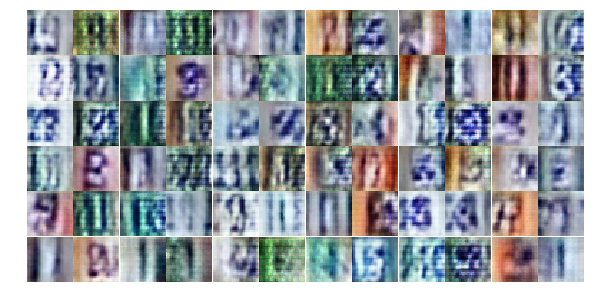

Epoch 4/25... Discriminator Loss: 0.4613... Generator Loss: 1.5791
Epoch 4/25... Discriminator Loss: 0.3070... Generator Loss: 1.8838
Epoch 4/25... Discriminator Loss: 0.4078... Generator Loss: 1.9731
Epoch 4/25... Discriminator Loss: 0.4757... Generator Loss: 1.8420
Epoch 4/25... Discriminator Loss: 0.4212... Generator Loss: 1.8583
Epoch 4/25... Discriminator Loss: 0.8744... Generator Loss: 2.5572
Epoch 4/25... Discriminator Loss: 0.7423... Generator Loss: 0.9102
Epoch 4/25... Discriminator Loss: 0.6528... Generator Loss: 1.2998
Epoch 4/25... Discriminator Loss: 0.4782... Generator Loss: 1.5945
Epoch 5/25... Discriminator Loss: 0.5366... Generator Loss: 1.5030


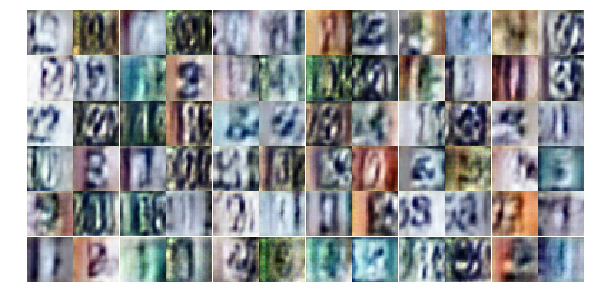

Epoch 5/25... Discriminator Loss: 1.1877... Generator Loss: 0.5133
Epoch 5/25... Discriminator Loss: 0.5717... Generator Loss: 1.5585
Epoch 5/25... Discriminator Loss: 0.5975... Generator Loss: 1.9930
Epoch 5/25... Discriminator Loss: 1.0649... Generator Loss: 0.5890
Epoch 5/25... Discriminator Loss: 0.7111... Generator Loss: 2.3006
Epoch 5/25... Discriminator Loss: 1.0469... Generator Loss: 0.5966
Epoch 5/25... Discriminator Loss: 0.4469... Generator Loss: 1.7960
Epoch 5/25... Discriminator Loss: 0.6368... Generator Loss: 1.1380
Epoch 5/25... Discriminator Loss: 0.7319... Generator Loss: 0.9051
Epoch 5/25... Discriminator Loss: 1.2634... Generator Loss: 0.5250


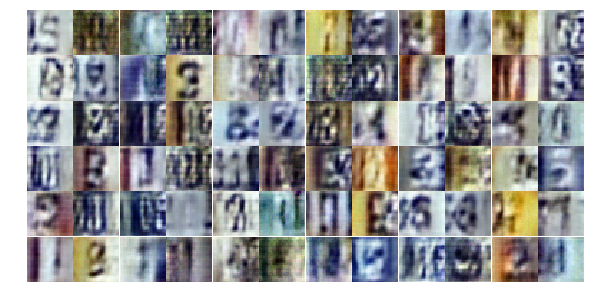

Epoch 5/25... Discriminator Loss: 0.5825... Generator Loss: 1.3535
Epoch 5/25... Discriminator Loss: 0.4427... Generator Loss: 1.6995
Epoch 5/25... Discriminator Loss: 0.5064... Generator Loss: 1.5237
Epoch 5/25... Discriminator Loss: 1.1414... Generator Loss: 0.5767
Epoch 5/25... Discriminator Loss: 1.5538... Generator Loss: 3.1188
Epoch 5/25... Discriminator Loss: 0.6221... Generator Loss: 1.3710
Epoch 5/25... Discriminator Loss: 0.6201... Generator Loss: 1.3776
Epoch 5/25... Discriminator Loss: 0.7733... Generator Loss: 1.8825
Epoch 5/25... Discriminator Loss: 0.6067... Generator Loss: 1.4687
Epoch 5/25... Discriminator Loss: 0.5593... Generator Loss: 1.4271


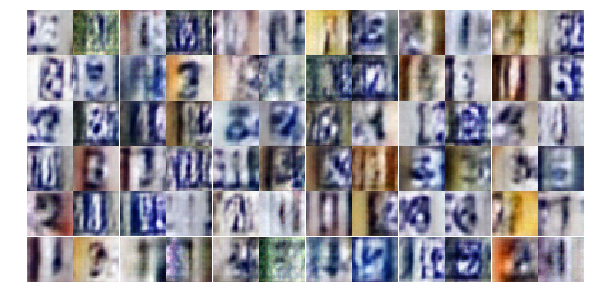

Epoch 5/25... Discriminator Loss: 0.5620... Generator Loss: 1.2431
Epoch 5/25... Discriminator Loss: 0.6675... Generator Loss: 1.0880
Epoch 5/25... Discriminator Loss: 0.5148... Generator Loss: 1.3040
Epoch 5/25... Discriminator Loss: 0.5785... Generator Loss: 1.1539
Epoch 5/25... Discriminator Loss: 0.6994... Generator Loss: 0.9444
Epoch 5/25... Discriminator Loss: 0.6542... Generator Loss: 1.2798
Epoch 5/25... Discriminator Loss: 0.6718... Generator Loss: 1.2094
Epoch 5/25... Discriminator Loss: 0.9996... Generator Loss: 0.6635
Epoch 5/25... Discriminator Loss: 0.8543... Generator Loss: 0.8947
Epoch 5/25... Discriminator Loss: 0.4742... Generator Loss: 1.5030


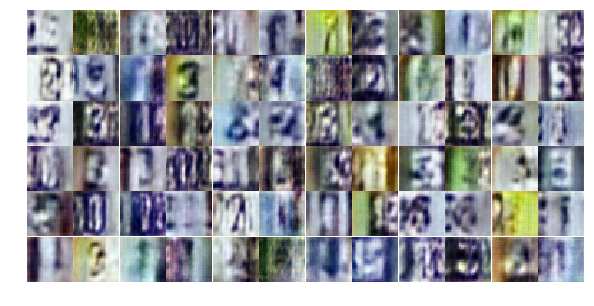

Epoch 5/25... Discriminator Loss: 0.6721... Generator Loss: 1.0419
Epoch 5/25... Discriminator Loss: 0.6354... Generator Loss: 1.2173
Epoch 5/25... Discriminator Loss: 0.8156... Generator Loss: 3.2125
Epoch 5/25... Discriminator Loss: 0.5840... Generator Loss: 1.6902
Epoch 5/25... Discriminator Loss: 1.2011... Generator Loss: 3.1609
Epoch 5/25... Discriminator Loss: 0.5981... Generator Loss: 1.6037
Epoch 5/25... Discriminator Loss: 0.7997... Generator Loss: 0.8085
Epoch 5/25... Discriminator Loss: 0.8355... Generator Loss: 0.8434
Epoch 5/25... Discriminator Loss: 0.8089... Generator Loss: 0.8782
Epoch 5/25... Discriminator Loss: 0.5674... Generator Loss: 1.3776


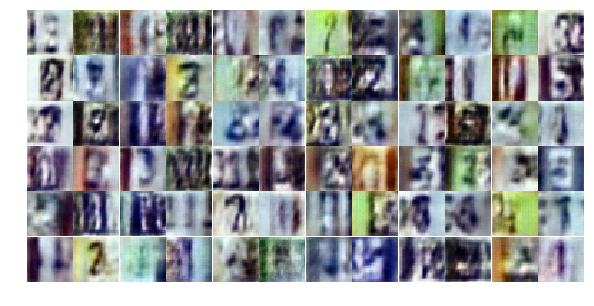

Epoch 5/25... Discriminator Loss: 0.4495... Generator Loss: 1.8241
Epoch 5/25... Discriminator Loss: 0.8090... Generator Loss: 0.7974
Epoch 5/25... Discriminator Loss: 1.0143... Generator Loss: 0.5878
Epoch 5/25... Discriminator Loss: 1.4702... Generator Loss: 0.4145
Epoch 5/25... Discriminator Loss: 0.8875... Generator Loss: 0.9539
Epoch 5/25... Discriminator Loss: 0.7967... Generator Loss: 1.0156
Epoch 5/25... Discriminator Loss: 1.0401... Generator Loss: 0.6387
Epoch 5/25... Discriminator Loss: 0.6044... Generator Loss: 1.3726
Epoch 5/25... Discriminator Loss: 0.4910... Generator Loss: 1.4100
Epoch 5/25... Discriminator Loss: 1.0152... Generator Loss: 0.6644


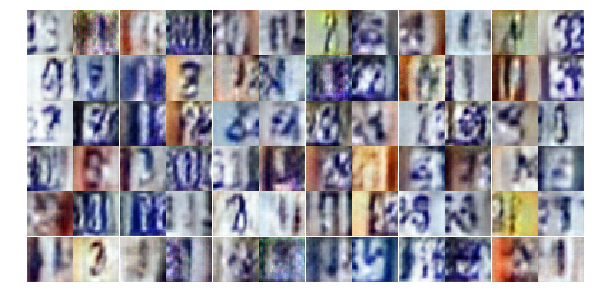

Epoch 5/25... Discriminator Loss: 0.5776... Generator Loss: 1.9370
Epoch 5/25... Discriminator Loss: 0.5015... Generator Loss: 1.4714
Epoch 5/25... Discriminator Loss: 0.7385... Generator Loss: 1.1209
Epoch 5/25... Discriminator Loss: 1.2684... Generator Loss: 0.4440
Epoch 5/25... Discriminator Loss: 0.7360... Generator Loss: 1.7286
Epoch 5/25... Discriminator Loss: 0.9195... Generator Loss: 1.3052
Epoch 6/25... Discriminator Loss: 1.1367... Generator Loss: 0.5678
Epoch 6/25... Discriminator Loss: 0.6086... Generator Loss: 1.1066
Epoch 6/25... Discriminator Loss: 0.5331... Generator Loss: 1.3273
Epoch 6/25... Discriminator Loss: 0.7895... Generator Loss: 0.8901


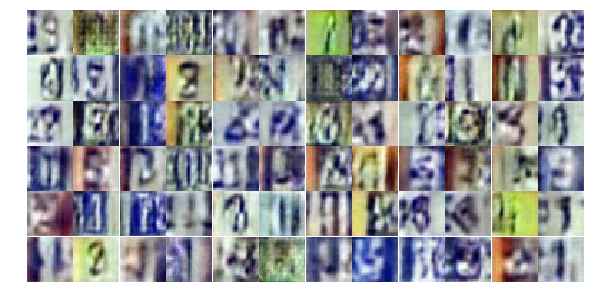

Epoch 6/25... Discriminator Loss: 0.6742... Generator Loss: 1.5492
Epoch 6/25... Discriminator Loss: 0.7236... Generator Loss: 2.2383
Epoch 6/25... Discriminator Loss: 0.7841... Generator Loss: 1.8243
Epoch 6/25... Discriminator Loss: 1.1747... Generator Loss: 0.6506
Epoch 6/25... Discriminator Loss: 1.0239... Generator Loss: 0.6454
Epoch 6/25... Discriminator Loss: 0.5952... Generator Loss: 1.1517
Epoch 6/25... Discriminator Loss: 0.6703... Generator Loss: 1.0199
Epoch 6/25... Discriminator Loss: 0.9218... Generator Loss: 0.6811
Epoch 6/25... Discriminator Loss: 1.0261... Generator Loss: 0.5554
Epoch 6/25... Discriminator Loss: 0.4214... Generator Loss: 1.8211


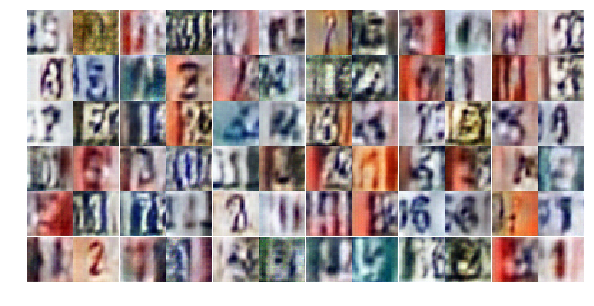

Epoch 6/25... Discriminator Loss: 0.7033... Generator Loss: 0.9620
Epoch 6/25... Discriminator Loss: 0.7542... Generator Loss: 0.8635
Epoch 6/25... Discriminator Loss: 1.0818... Generator Loss: 0.5734
Epoch 6/25... Discriminator Loss: 0.3914... Generator Loss: 1.5682
Epoch 6/25... Discriminator Loss: 0.3851... Generator Loss: 1.8787
Epoch 6/25... Discriminator Loss: 0.5656... Generator Loss: 1.8172
Epoch 6/25... Discriminator Loss: 0.6902... Generator Loss: 1.8321
Epoch 6/25... Discriminator Loss: 0.5084... Generator Loss: 1.7766
Epoch 6/25... Discriminator Loss: 0.7948... Generator Loss: 2.4747
Epoch 6/25... Discriminator Loss: 0.9717... Generator Loss: 0.7544


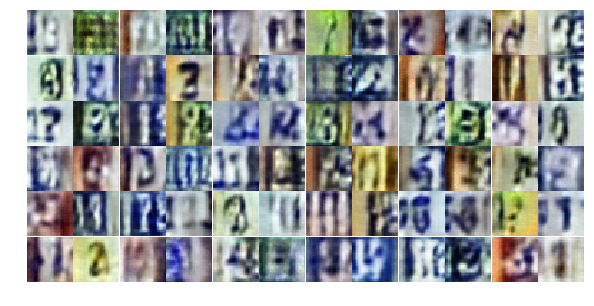

Epoch 6/25... Discriminator Loss: 0.8110... Generator Loss: 0.8061
Epoch 6/25... Discriminator Loss: 0.8006... Generator Loss: 0.9663
Epoch 6/25... Discriminator Loss: 1.1438... Generator Loss: 0.5391
Epoch 6/25... Discriminator Loss: 1.2109... Generator Loss: 0.5048
Epoch 6/25... Discriminator Loss: 0.6355... Generator Loss: 2.3766
Epoch 6/25... Discriminator Loss: 0.8019... Generator Loss: 0.8665
Epoch 6/25... Discriminator Loss: 0.6740... Generator Loss: 1.0771
Epoch 6/25... Discriminator Loss: 0.4344... Generator Loss: 1.3917
Epoch 6/25... Discriminator Loss: 0.6256... Generator Loss: 1.1139
Epoch 6/25... Discriminator Loss: 0.5140... Generator Loss: 1.6783


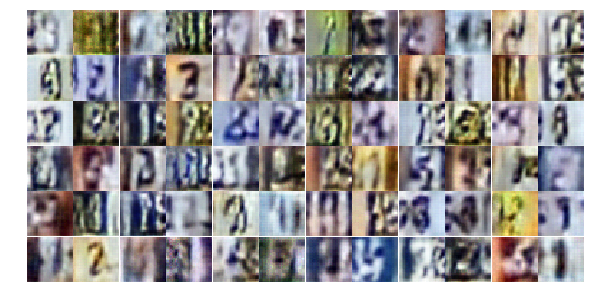

Epoch 6/25... Discriminator Loss: 1.0364... Generator Loss: 0.5892
Epoch 6/25... Discriminator Loss: 0.7296... Generator Loss: 1.9915
Epoch 6/25... Discriminator Loss: 2.1754... Generator Loss: 0.9767
Epoch 6/25... Discriminator Loss: 0.9983... Generator Loss: 0.6924
Epoch 6/25... Discriminator Loss: 0.8548... Generator Loss: 0.7387
Epoch 6/25... Discriminator Loss: 0.7431... Generator Loss: 1.0845
Epoch 6/25... Discriminator Loss: 0.7311... Generator Loss: 0.9597
Epoch 6/25... Discriminator Loss: 0.5363... Generator Loss: 2.1291
Epoch 6/25... Discriminator Loss: 0.8571... Generator Loss: 0.8817
Epoch 6/25... Discriminator Loss: 0.3613... Generator Loss: 1.8152


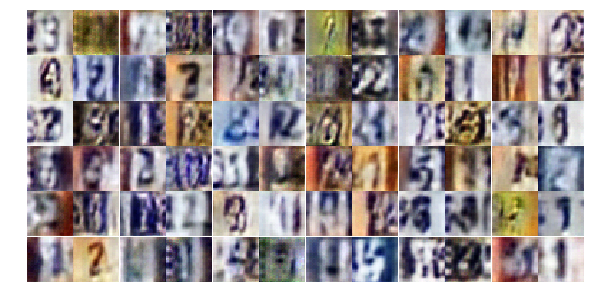

Epoch 6/25... Discriminator Loss: 0.9076... Generator Loss: 2.1570
Epoch 6/25... Discriminator Loss: 0.8759... Generator Loss: 1.0757
Epoch 6/25... Discriminator Loss: 0.8023... Generator Loss: 0.8896
Epoch 6/25... Discriminator Loss: 0.5118... Generator Loss: 1.4693
Epoch 6/25... Discriminator Loss: 0.9981... Generator Loss: 2.7145
Epoch 6/25... Discriminator Loss: 0.6918... Generator Loss: 1.2147
Epoch 6/25... Discriminator Loss: 0.9235... Generator Loss: 0.7467
Epoch 6/25... Discriminator Loss: 0.8422... Generator Loss: 0.8039
Epoch 6/25... Discriminator Loss: 0.5538... Generator Loss: 1.5101
Epoch 6/25... Discriminator Loss: 1.7639... Generator Loss: 0.2427


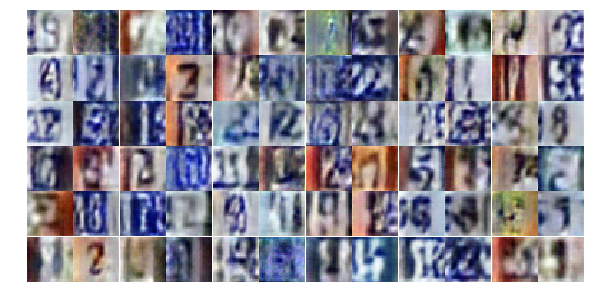

Epoch 6/25... Discriminator Loss: 0.7862... Generator Loss: 0.8551
Epoch 6/25... Discriminator Loss: 0.4240... Generator Loss: 1.8543
Epoch 6/25... Discriminator Loss: 1.6990... Generator Loss: 0.2774
Epoch 7/25... Discriminator Loss: 0.6107... Generator Loss: 1.6743
Epoch 7/25... Discriminator Loss: 0.8285... Generator Loss: 0.9989
Epoch 7/25... Discriminator Loss: 0.6310... Generator Loss: 1.3113
Epoch 7/25... Discriminator Loss: 0.8241... Generator Loss: 0.8672
Epoch 7/25... Discriminator Loss: 0.6664... Generator Loss: 1.0634
Epoch 7/25... Discriminator Loss: 0.6600... Generator Loss: 1.7527
Epoch 7/25... Discriminator Loss: 1.1614... Generator Loss: 0.6221


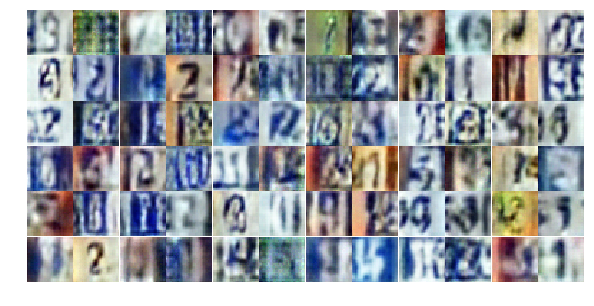

Epoch 7/25... Discriminator Loss: 0.6556... Generator Loss: 1.1536
Epoch 7/25... Discriminator Loss: 0.8663... Generator Loss: 0.8060
Epoch 7/25... Discriminator Loss: 0.7624... Generator Loss: 1.2545
Epoch 7/25... Discriminator Loss: 0.6749... Generator Loss: 1.2452
Epoch 7/25... Discriminator Loss: 0.6489... Generator Loss: 1.3705
Epoch 7/25... Discriminator Loss: 0.5551... Generator Loss: 1.2098
Epoch 7/25... Discriminator Loss: 1.1155... Generator Loss: 2.3030
Epoch 7/25... Discriminator Loss: 1.1414... Generator Loss: 2.0398
Epoch 7/25... Discriminator Loss: 0.8592... Generator Loss: 2.5580
Epoch 7/25... Discriminator Loss: 0.5646... Generator Loss: 1.5649


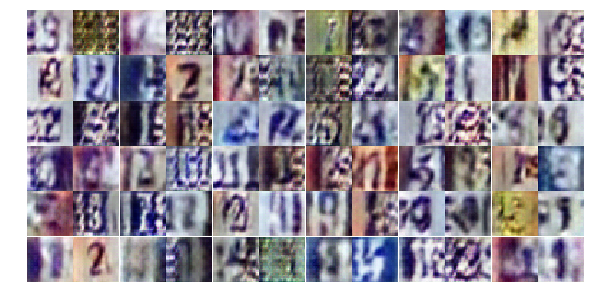

Epoch 7/25... Discriminator Loss: 0.7199... Generator Loss: 1.0850
Epoch 7/25... Discriminator Loss: 0.6824... Generator Loss: 1.1359
Epoch 7/25... Discriminator Loss: 0.9719... Generator Loss: 0.6929
Epoch 7/25... Discriminator Loss: 0.6741... Generator Loss: 1.0549
Epoch 7/25... Discriminator Loss: 0.4520... Generator Loss: 1.5952
Epoch 7/25... Discriminator Loss: 0.6085... Generator Loss: 1.4139
Epoch 7/25... Discriminator Loss: 0.5676... Generator Loss: 1.7286
Epoch 7/25... Discriminator Loss: 1.0436... Generator Loss: 0.6464
Epoch 7/25... Discriminator Loss: 0.4576... Generator Loss: 1.6000
Epoch 7/25... Discriminator Loss: 0.5472... Generator Loss: 2.0412


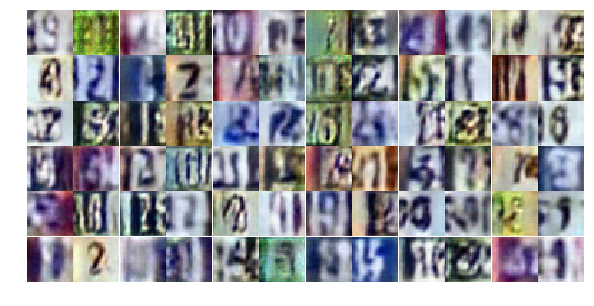

Epoch 7/25... Discriminator Loss: 0.7912... Generator Loss: 0.8403
Epoch 7/25... Discriminator Loss: 2.0244... Generator Loss: 0.1976
Epoch 7/25... Discriminator Loss: 0.6522... Generator Loss: 1.0255
Epoch 7/25... Discriminator Loss: 0.6753... Generator Loss: 0.9285
Epoch 7/25... Discriminator Loss: 0.6119... Generator Loss: 1.2194
Epoch 7/25... Discriminator Loss: 1.1454... Generator Loss: 0.5228
Epoch 7/25... Discriminator Loss: 0.5718... Generator Loss: 1.3621
Epoch 7/25... Discriminator Loss: 0.7661... Generator Loss: 0.9333
Epoch 7/25... Discriminator Loss: 1.1755... Generator Loss: 0.4786
Epoch 7/25... Discriminator Loss: 0.7751... Generator Loss: 2.5352


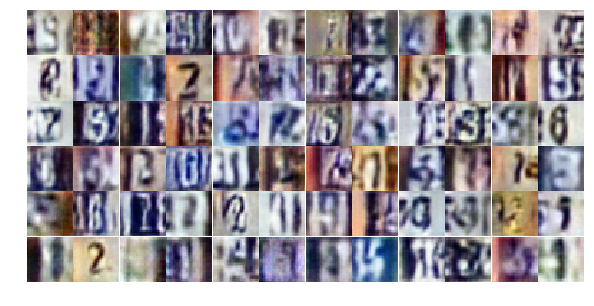

Epoch 7/25... Discriminator Loss: 1.1966... Generator Loss: 0.5582
Epoch 7/25... Discriminator Loss: 0.9090... Generator Loss: 1.1928
Epoch 7/25... Discriminator Loss: 0.6318... Generator Loss: 2.2118
Epoch 7/25... Discriminator Loss: 0.6690... Generator Loss: 1.8773
Epoch 7/25... Discriminator Loss: 1.0607... Generator Loss: 0.6291
Epoch 7/25... Discriminator Loss: 0.3998... Generator Loss: 1.7079
Epoch 7/25... Discriminator Loss: 0.4394... Generator Loss: 1.4726
Epoch 7/25... Discriminator Loss: 1.8958... Generator Loss: 0.3632
Epoch 7/25... Discriminator Loss: 0.7975... Generator Loss: 0.9527
Epoch 7/25... Discriminator Loss: 1.2276... Generator Loss: 0.6740


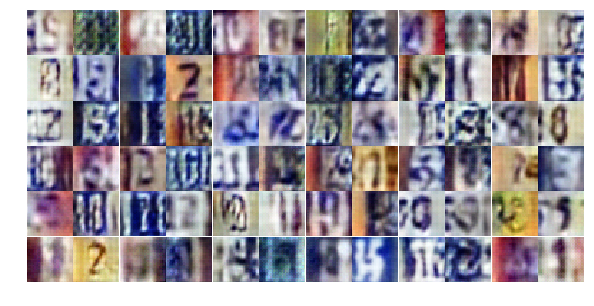

Epoch 7/25... Discriminator Loss: 0.4813... Generator Loss: 1.8818
Epoch 7/25... Discriminator Loss: 0.6458... Generator Loss: 1.2734
Epoch 7/25... Discriminator Loss: 0.9598... Generator Loss: 0.7703
Epoch 7/25... Discriminator Loss: 0.6071... Generator Loss: 1.2100
Epoch 7/25... Discriminator Loss: 0.6796... Generator Loss: 1.0955
Epoch 7/25... Discriminator Loss: 0.5936... Generator Loss: 1.5024
Epoch 7/25... Discriminator Loss: 1.5027... Generator Loss: 0.3320
Epoch 7/25... Discriminator Loss: 0.6802... Generator Loss: 1.5454
Epoch 7/25... Discriminator Loss: 0.6879... Generator Loss: 1.2666
Epoch 7/25... Discriminator Loss: 0.5172... Generator Loss: 1.2027


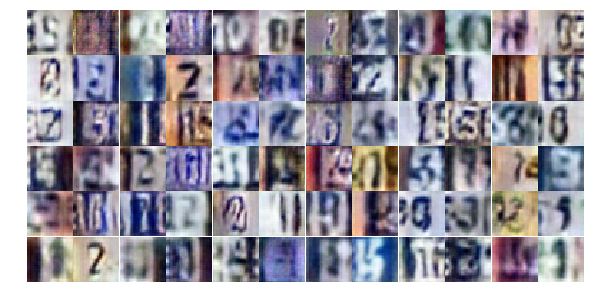

Epoch 7/25... Discriminator Loss: 0.4446... Generator Loss: 2.4884
Epoch 8/25... Discriminator Loss: 0.8383... Generator Loss: 0.8939
Epoch 8/25... Discriminator Loss: 0.6542... Generator Loss: 1.0250
Epoch 8/25... Discriminator Loss: 0.6735... Generator Loss: 1.0591
Epoch 8/25... Discriminator Loss: 1.0090... Generator Loss: 0.6430
Epoch 8/25... Discriminator Loss: 0.8222... Generator Loss: 1.2647
Epoch 8/25... Discriminator Loss: 0.5272... Generator Loss: 1.2966
Epoch 8/25... Discriminator Loss: 0.4590... Generator Loss: 1.7363
Epoch 8/25... Discriminator Loss: 0.9123... Generator Loss: 0.8921
Epoch 8/25... Discriminator Loss: 0.7025... Generator Loss: 1.4436


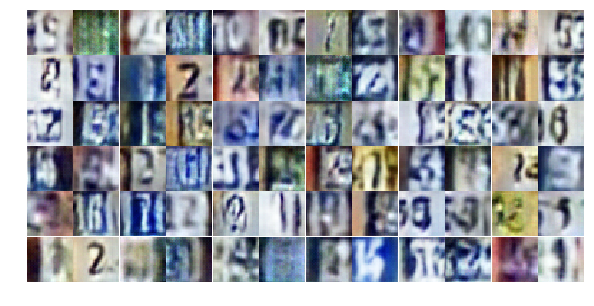

Epoch 8/25... Discriminator Loss: 0.6106... Generator Loss: 2.5444
Epoch 8/25... Discriminator Loss: 0.6914... Generator Loss: 1.0263
Epoch 8/25... Discriminator Loss: 0.6611... Generator Loss: 1.0126
Epoch 8/25... Discriminator Loss: 0.4791... Generator Loss: 2.3212
Epoch 8/25... Discriminator Loss: 0.6844... Generator Loss: 1.0368
Epoch 8/25... Discriminator Loss: 0.8356... Generator Loss: 1.0276
Epoch 8/25... Discriminator Loss: 0.4198... Generator Loss: 1.5506
Epoch 8/25... Discriminator Loss: 0.6701... Generator Loss: 2.3791
Epoch 8/25... Discriminator Loss: 0.6432... Generator Loss: 1.1741
Epoch 8/25... Discriminator Loss: 0.9934... Generator Loss: 1.3034


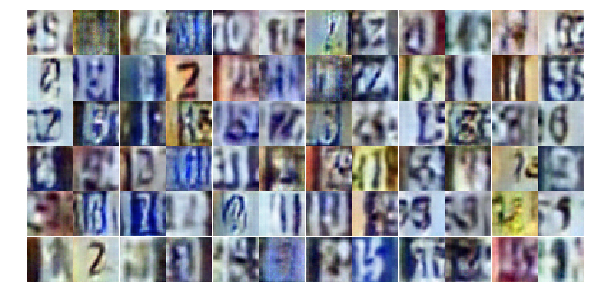

Epoch 8/25... Discriminator Loss: 0.3982... Generator Loss: 1.7611
Epoch 8/25... Discriminator Loss: 0.4525... Generator Loss: 1.4259
Epoch 8/25... Discriminator Loss: 0.9397... Generator Loss: 2.2478
Epoch 8/25... Discriminator Loss: 0.7378... Generator Loss: 1.1668
Epoch 8/25... Discriminator Loss: 0.3587... Generator Loss: 1.8844
Epoch 8/25... Discriminator Loss: 1.0051... Generator Loss: 0.7192
Epoch 8/25... Discriminator Loss: 1.0205... Generator Loss: 0.6855
Epoch 8/25... Discriminator Loss: 0.5118... Generator Loss: 1.3275
Epoch 8/25... Discriminator Loss: 0.7488... Generator Loss: 1.6521
Epoch 8/25... Discriminator Loss: 0.8852... Generator Loss: 0.7561


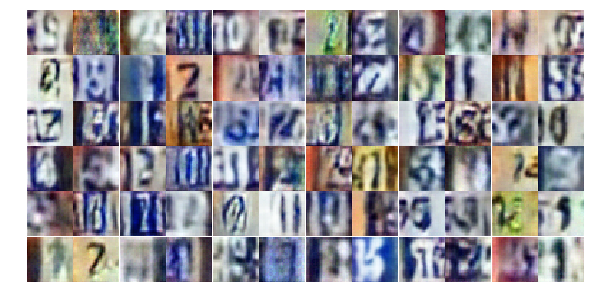

Epoch 8/25... Discriminator Loss: 0.5720... Generator Loss: 1.3880
Epoch 8/25... Discriminator Loss: 0.9587... Generator Loss: 0.6485
Epoch 8/25... Discriminator Loss: 0.8001... Generator Loss: 1.0014
Epoch 8/25... Discriminator Loss: 0.7839... Generator Loss: 0.8022
Epoch 8/25... Discriminator Loss: 0.6624... Generator Loss: 1.0722
Epoch 8/25... Discriminator Loss: 0.4434... Generator Loss: 1.7180
Epoch 8/25... Discriminator Loss: 0.5482... Generator Loss: 1.7694
Epoch 8/25... Discriminator Loss: 0.8387... Generator Loss: 0.8122
Epoch 8/25... Discriminator Loss: 0.7804... Generator Loss: 1.8046
Epoch 8/25... Discriminator Loss: 0.5674... Generator Loss: 1.5134


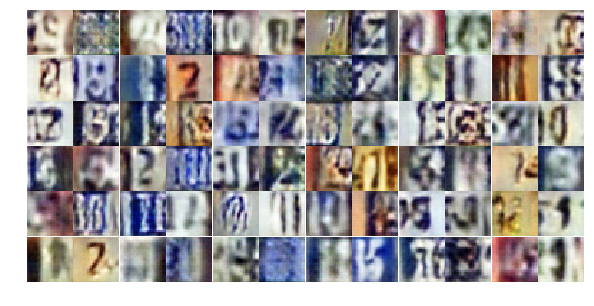

Epoch 8/25... Discriminator Loss: 0.5174... Generator Loss: 2.0393
Epoch 8/25... Discriminator Loss: 1.0700... Generator Loss: 0.6185
Epoch 8/25... Discriminator Loss: 0.5111... Generator Loss: 1.2438
Epoch 8/25... Discriminator Loss: 0.4967... Generator Loss: 1.2659
Epoch 8/25... Discriminator Loss: 0.7795... Generator Loss: 1.8444
Epoch 8/25... Discriminator Loss: 0.6431... Generator Loss: 1.8724
Epoch 8/25... Discriminator Loss: 0.5682... Generator Loss: 1.3044
Epoch 8/25... Discriminator Loss: 0.5046... Generator Loss: 1.7665
Epoch 8/25... Discriminator Loss: 0.5526... Generator Loss: 1.4332
Epoch 8/25... Discriminator Loss: 0.9373... Generator Loss: 0.6871


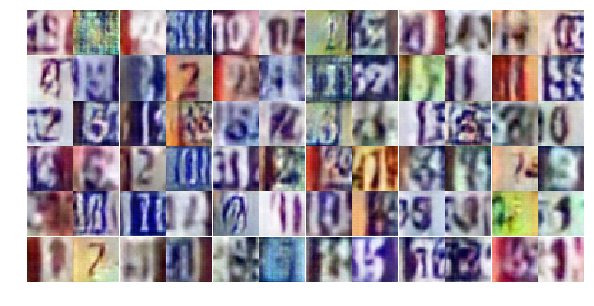

Epoch 8/25... Discriminator Loss: 0.6233... Generator Loss: 1.3210
Epoch 8/25... Discriminator Loss: 0.8104... Generator Loss: 0.8476
Epoch 8/25... Discriminator Loss: 1.7187... Generator Loss: 0.2695
Epoch 8/25... Discriminator Loss: 1.1016... Generator Loss: 0.5336
Epoch 8/25... Discriminator Loss: 0.3964... Generator Loss: 2.2306
Epoch 8/25... Discriminator Loss: 0.7796... Generator Loss: 1.1178
Epoch 8/25... Discriminator Loss: 2.4056... Generator Loss: 4.9562
Epoch 8/25... Discriminator Loss: 1.0494... Generator Loss: 2.1760
Epoch 9/25... Discriminator Loss: 0.8768... Generator Loss: 1.0297
Epoch 9/25... Discriminator Loss: 1.0137... Generator Loss: 0.6016


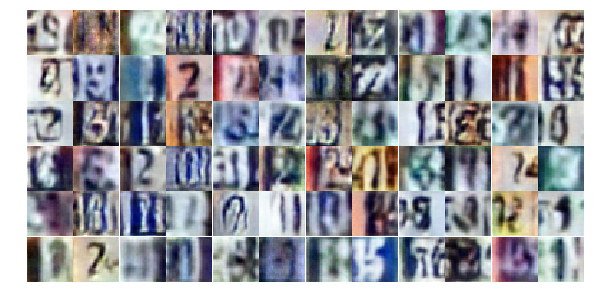

Epoch 9/25... Discriminator Loss: 0.6395... Generator Loss: 1.1949
Epoch 9/25... Discriminator Loss: 0.7492... Generator Loss: 1.2735
Epoch 9/25... Discriminator Loss: 1.0495... Generator Loss: 0.6587
Epoch 9/25... Discriminator Loss: 0.5450... Generator Loss: 1.5003
Epoch 9/25... Discriminator Loss: 0.7829... Generator Loss: 0.9368
Epoch 9/25... Discriminator Loss: 0.6156... Generator Loss: 2.3755
Epoch 9/25... Discriminator Loss: 0.7669... Generator Loss: 1.1497
Epoch 9/25... Discriminator Loss: 0.6005... Generator Loss: 1.5571
Epoch 9/25... Discriminator Loss: 0.8451... Generator Loss: 0.8246
Epoch 9/25... Discriminator Loss: 0.6085... Generator Loss: 1.5597


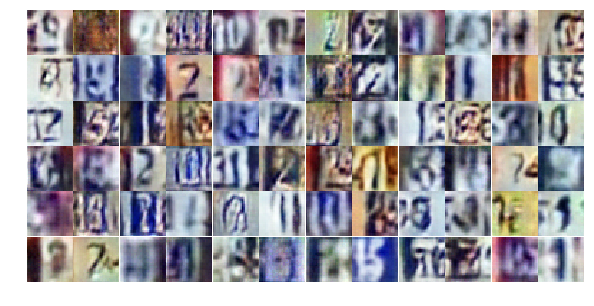

Epoch 9/25... Discriminator Loss: 0.9555... Generator Loss: 0.6874
Epoch 9/25... Discriminator Loss: 1.5253... Generator Loss: 0.3879
Epoch 9/25... Discriminator Loss: 0.8140... Generator Loss: 0.9998
Epoch 9/25... Discriminator Loss: 0.6686... Generator Loss: 0.9759
Epoch 9/25... Discriminator Loss: 0.5902... Generator Loss: 1.2082
Epoch 9/25... Discriminator Loss: 1.0363... Generator Loss: 0.5810
Epoch 9/25... Discriminator Loss: 0.8812... Generator Loss: 0.7647
Epoch 9/25... Discriminator Loss: 0.5592... Generator Loss: 1.3205
Epoch 9/25... Discriminator Loss: 1.0660... Generator Loss: 0.5704
Epoch 9/25... Discriminator Loss: 0.7976... Generator Loss: 0.9782


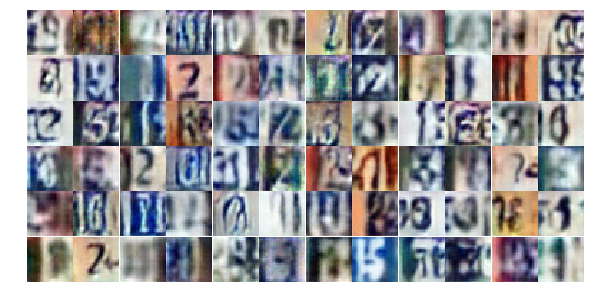

Epoch 9/25... Discriminator Loss: 0.8621... Generator Loss: 0.8676
Epoch 9/25... Discriminator Loss: 1.0469... Generator Loss: 0.5605
Epoch 9/25... Discriminator Loss: 0.7003... Generator Loss: 1.6879
Epoch 9/25... Discriminator Loss: 0.7517... Generator Loss: 1.1747
Epoch 9/25... Discriminator Loss: 0.6847... Generator Loss: 1.5418
Epoch 9/25... Discriminator Loss: 0.5388... Generator Loss: 1.2680
Epoch 9/25... Discriminator Loss: 0.9510... Generator Loss: 0.6673
Epoch 9/25... Discriminator Loss: 1.6753... Generator Loss: 3.7441
Epoch 9/25... Discriminator Loss: 0.5632... Generator Loss: 1.3980
Epoch 9/25... Discriminator Loss: 0.6144... Generator Loss: 1.1879


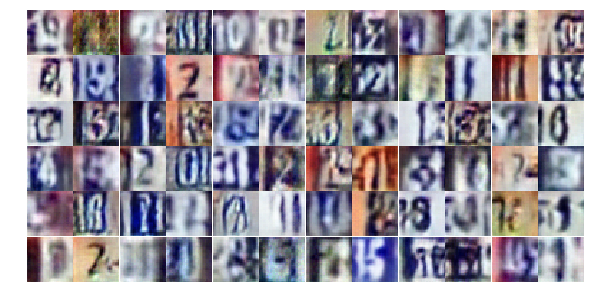

Epoch 9/25... Discriminator Loss: 0.4731... Generator Loss: 1.4420
Epoch 9/25... Discriminator Loss: 0.9159... Generator Loss: 0.6694
Epoch 9/25... Discriminator Loss: 1.6680... Generator Loss: 0.4345
Epoch 9/25... Discriminator Loss: 0.5954... Generator Loss: 1.3725
Epoch 9/25... Discriminator Loss: 0.6148... Generator Loss: 1.3462
Epoch 9/25... Discriminator Loss: 0.7240... Generator Loss: 1.2392
Epoch 9/25... Discriminator Loss: 0.7032... Generator Loss: 1.2194
Epoch 9/25... Discriminator Loss: 0.4053... Generator Loss: 1.7319
Epoch 9/25... Discriminator Loss: 1.0913... Generator Loss: 0.5571
Epoch 9/25... Discriminator Loss: 0.7541... Generator Loss: 0.9249


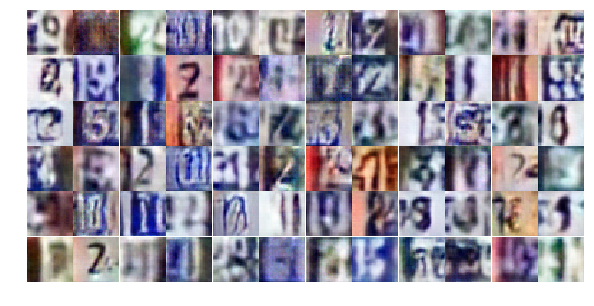

Epoch 9/25... Discriminator Loss: 0.5130... Generator Loss: 1.8975
Epoch 9/25... Discriminator Loss: 0.5601... Generator Loss: 1.5145
Epoch 9/25... Discriminator Loss: 0.9209... Generator Loss: 2.0166
Epoch 9/25... Discriminator Loss: 0.8450... Generator Loss: 1.0170
Epoch 9/25... Discriminator Loss: 0.4096... Generator Loss: 2.3707
Epoch 9/25... Discriminator Loss: 0.8259... Generator Loss: 0.8364
Epoch 9/25... Discriminator Loss: 0.6451... Generator Loss: 1.4263
Epoch 9/25... Discriminator Loss: 1.1255... Generator Loss: 0.4950
Epoch 9/25... Discriminator Loss: 0.4790... Generator Loss: 1.5094
Epoch 9/25... Discriminator Loss: 0.8622... Generator Loss: 2.3674


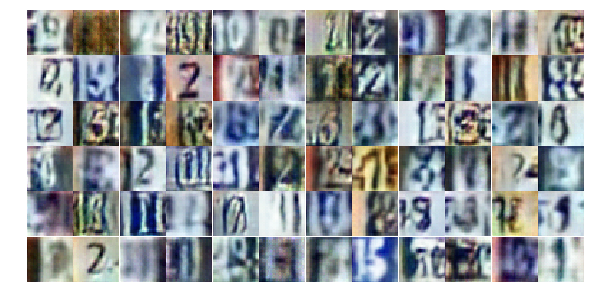

Epoch 9/25... Discriminator Loss: 1.6027... Generator Loss: 0.9052
Epoch 9/25... Discriminator Loss: 0.7416... Generator Loss: 1.7533
Epoch 9/25... Discriminator Loss: 0.8651... Generator Loss: 0.8150
Epoch 9/25... Discriminator Loss: 1.1527... Generator Loss: 0.4978
Epoch 9/25... Discriminator Loss: 0.9304... Generator Loss: 0.7387
Epoch 10/25... Discriminator Loss: 0.6990... Generator Loss: 1.3438
Epoch 10/25... Discriminator Loss: 0.7180... Generator Loss: 1.1606
Epoch 10/25... Discriminator Loss: 0.7661... Generator Loss: 0.9546
Epoch 10/25... Discriminator Loss: 1.0557... Generator Loss: 0.6204
Epoch 10/25... Discriminator Loss: 1.3345... Generator Loss: 0.3870


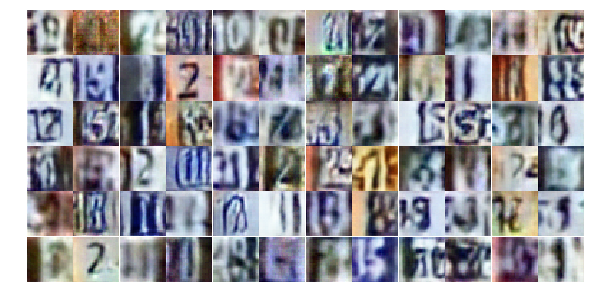

Epoch 10/25... Discriminator Loss: 0.8063... Generator Loss: 0.9242
Epoch 10/25... Discriminator Loss: 0.5588... Generator Loss: 1.2482
Epoch 10/25... Discriminator Loss: 0.6032... Generator Loss: 1.1940
Epoch 10/25... Discriminator Loss: 0.5881... Generator Loss: 1.4203


In [ ]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()